### Name: Sat Naing Tun, ID:125333



In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader

from PIL import Image
import matplotlib.pyplot as plt
import glob, random, os, time


In [2]:
!pip install tensorboardX tensorboard

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 5.0 MB/s eta 0:00:00


In [3]:
from tensorboardX import SummaryWriter

In [4]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Using device: {device}")

✅ Using device: cuda


In [5]:
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

transform_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

In [6]:
import requests
from tqdm import tqdm

def download_big_file(dest_path,url):
    # Ensure destination directory exists
    os.makedirs(os.path.dirname(dest_path), exist_ok=True)

    if os.path.exists(dest_path):
        print(f"✅ Skipping {os.path.basename(dest_path)} (already exists)")
        return

    response = requests.get(url, stream=True)
    total = int(response.headers.get('content-length', 0))

    with open(dest_path, 'wb') as file, tqdm(
        desc=os.path.basename(dest_path),
        total=total,
        unit='B',
        unit_scale=True,
        unit_divisor=1024,
    ) as bar:
        for data in response.iter_content(chunk_size=1024):
            size = file.write(data)
            bar.update(size)

In [7]:
import zipfile

def unzip_folder(zip_path, extract_to, sub_dir="train"):
    expected_path = os.path.join(extract_to, sub_dir)
    if os.path.exists(expected_path) and any(os.scandir(expected_path)):
        print(f"⚠️ Skipping extraction: {expected_path} already populated")
        return

    print(f"📦 Extracting {os.path.basename(zip_path)} → {extract_to}")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        for member in tqdm(zip_ref.infolist(), desc="Extracting", unit="file"):
            zip_ref.extract(member, extract_to)

In [8]:
raw_zip_dir = "DLCV_Lab_Dataset/raw_zips/sports-classification.zip"
source_url = "https://www.kaggle.com/api/v1/datasets/download/gpiosenka/sports-classification"
download_big_file(raw_zip_dir, source_url)

sports-classification.zip: 100%|██████████| 424M/424M [00:08<00:00, 49.9MB/s]


In [9]:
zip_path = "DLCV_Lab_Dataset/raw_zips/sports-classification.zip"
extract_path = "DLCV_Lab_Dataset/sports-classification"

unzip_folder(zip_path, extract_path)

📦 Extracting sports-classification.zip → DLCV_Lab_Dataset/sports-classification


Extracting: 100%|██████████| 14495/14495 [00:05<00:00, 2789.62file/s]


In [10]:
# from google.colab import drive
# drive.mount('/content/drive')

In [11]:
data_root = "DLCV_Lab_Dataset/sports-classification"
train_dataset = datasets.ImageFolder(os.path.join(data_root, "train"), transform=transform_train)
val_dataset   = datasets.ImageFolder(os.path.join(data_root, "valid"),   transform=transform_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2)

class_names = train_dataset.classes
num_classes = len(class_names)
print(f"✅ Classes found: {class_names} ({num_classes} total)")

✅ Classes found: ['air hockey', 'ampute football', 'archery', 'arm wrestling', 'axe throwing', 'balance beam', 'barell racing', 'baseball', 'basketball', 'baton twirling', 'bike polo', 'billiards', 'bmx', 'bobsled', 'bowling', 'boxing', 'bull riding', 'bungee jumping', 'canoe slamon', 'cheerleading', 'chuckwagon racing', 'cricket', 'croquet', 'curling', 'disc golf', 'fencing', 'field hockey', 'figure skating men', 'figure skating pairs', 'figure skating women', 'fly fishing', 'football', 'formula 1 racing', 'frisbee', 'gaga', 'giant slalom', 'golf', 'hammer throw', 'hang gliding', 'harness racing', 'high jump', 'hockey', 'horse jumping', 'horse racing', 'horseshoe pitching', 'hurdles', 'hydroplane racing', 'ice climbing', 'ice yachting', 'jai alai', 'javelin', 'jousting', 'judo', 'lacrosse', 'log rolling', 'luge', 'motorcycle racing', 'mushing', 'nascar racing', 'olympic wrestling', 'parallel bar', 'pole climbing', 'pole dancing', 'pole vault', 'polo', 'pommel horse', 'rings', 'rock cl

In [12]:
vit_model = models.vit_b_16(weights=models.ViT_B_16_Weights.IMAGENET1K_V1)

# Replace classifier head for your dataset
vit_model.heads.head = nn.Linear(vit_model.heads.head.in_features, num_classes)
vit_model = vit_model.to(device)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:01<00:00, 189MB/s]


In [13]:
def train_one_epoch(model, dataloader, criterion, optimizer, device, epoch):
    model.train()
    running_loss = 0.0
    loop = tqdm(dataloader, desc=f"Epoch {epoch+1} [Train]", leave=False)
    for imgs, labels in loop:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        loop.set_postfix({"Loss": f"{loss.item():.4f}"})
    return running_loss / len(dataloader)

In [14]:
def validate_model(model, dataloader, criterion, device, epoch):
    model.eval()
    total_loss, correct, total = 0.0, 0, 0
    loop = tqdm(dataloader, desc=f"Epoch {epoch+1} [Val]", leave=False)
    with torch.no_grad():
        for imgs, labels in loop:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            total_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            loop.set_postfix({"Loss": f"{loss.item():.4f}"})
    val_loss = total_loss / len(dataloader)
    val_acc = 100 * correct / total
    return val_loss, val_acc

In [15]:
def train_model(model, train_loader, val_loader, device,
                num_epochs=100, lr=3e-5, weight_decay=1e-4,
                step_size=30, gamma=0.5, log_dir='./runs/vit_finetune'):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=step_size, gamma=gamma)
    writer = SummaryWriter(log_dir=log_dir)

    best_acc = 0.0
    best_model_wts = None
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, train_loader, criterion, optimizer, device, epoch)
        val_loss, val_acc = validate_model(model, val_loader, criterion, device, epoch)
        scheduler.step()

        # TensorBoard logging
        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Loss/val', val_loss, epoch)
        writer.add_scalar('Accuracy/val', val_acc, epoch)

        # Save best
        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

    writer.close()
    print(f"\n✅ Best Validation Accuracy: {best_acc:.2f}%")
    return best_model_wts, history

In [16]:
log_dir = f'./runs/vit_finetune_{time.strftime("%Y%m%d_%H%M%S")}'
best_wts, history = train_model(
    vit_model,
    train_loader,
    val_loader,
    device,
    num_epochs=100,
    lr=3e-5,
    weight_decay=1e-4,
    step_size=30,
    gamma=0.5,
    log_dir=log_dir
)

Epoch [1/100] Train Loss: 1.6837 | Val Loss: 0.4057 | Val Acc: 96.20%


Epoch [2/100] Train Loss: 0.2930 | Val Loss: 0.1757 | Val Acc: 96.60%


Epoch [3/100] Train Loss: 0.1184 | Val Loss: 0.1477 | Val Acc: 96.80%


Epoch [4/100] Train Loss: 0.0642 | Val Loss: 0.1037 | Val Acc: 97.60%


Epoch [5/100] Train Loss: 0.0565 | Val Loss: 0.0987 | Val Acc: 97.60%


Epoch [6/100] Train Loss: 0.0305 | Val Loss: 0.0868 | Val Acc: 96.80%


Epoch [7/100] Train Loss: 0.0370 | Val Loss: 0.1231 | Val Acc: 96.40%


Epoch [8/100] Train Loss: 0.0361 | Val Loss: 0.1086 | Val Acc: 97.40%


Epoch [9/100] Train Loss: 0.0416 | Val Loss: 0.1188 | Val Acc: 96.40%


Epoch [10/100] Train Loss: 0.0446 | Val Loss: 0.0899 | Val Acc: 96.80%


Epoch [11/100] Train Loss: 0.0233 | Val Loss: 0.0769 | Val Acc: 97.40%


Epoch [12/100] Train Loss: 0.0238 | Val Loss: 0.0804 | Val Acc: 96.80%


Epoch [13/100] Train Loss: 0.0267 | Val Loss: 0.0967 | Val Acc: 96.80%


Epoch [14/100] Train Loss: 0.0281 | Val Loss: 0.0886 | Val Acc: 97.20%


Epoch [15/100] Train Loss: 0.0343 | Val Loss: 0.0910 | Val Acc: 97.40%


Epoch [16/100] Train Loss: 0.0214 | Val Loss: 0.0874 | Val Acc: 97.40%


Epoch [17/100] Train Loss: 0.0281 | Val Loss: 0.0996 | Val Acc: 96.00%


Epoch [18/100] Train Loss: 0.0291 | Val Loss: 0.0799 | Val Acc: 97.60%


Epoch [19/100] Train Loss: 0.0171 | Val Loss: 0.1210 | Val Acc: 96.80%


Epoch [20/100] Train Loss: 0.0305 | Val Loss: 0.1045 | Val Acc: 96.80%


Epoch [21/100] Train Loss: 0.0160 | Val Loss: 0.1378 | Val Acc: 96.20%


Epoch [22/100] Train Loss: 0.0279 | Val Loss: 0.1783 | Val Acc: 95.80%


Epoch [23/100] Train Loss: 0.0218 | Val Loss: 0.0667 | Val Acc: 97.60%


Epoch [24/100] Train Loss: 0.0182 | Val Loss: 0.1352 | Val Acc: 96.40%


Epoch [25/100] Train Loss: 0.0316 | Val Loss: 0.0987 | Val Acc: 96.60%


Epoch [26/100] Train Loss: 0.0163 | Val Loss: 0.0996 | Val Acc: 96.80%


Epoch [27/100] Train Loss: 0.0231 | Val Loss: 0.1449 | Val Acc: 95.40%


Epoch [28/100] Train Loss: 0.0161 | Val Loss: 0.1617 | Val Acc: 96.00%


Epoch [29/100] Train Loss: 0.0424 | Val Loss: 0.1533 | Val Acc: 95.20%


Epoch [30/100] Train Loss: 0.0171 | Val Loss: 0.1476 | Val Acc: 95.80%


Epoch [31/100] Train Loss: 0.0042 | Val Loss: 0.0802 | Val Acc: 97.80%


Epoch [32/100] Train Loss: 0.0029 | Val Loss: 0.0777 | Val Acc: 97.40%


Epoch [33/100] Train Loss: 0.0041 | Val Loss: 0.0665 | Val Acc: 98.40%


Epoch [34/100] Train Loss: 0.0010 | Val Loss: 0.0656 | Val Acc: 98.00%


Epoch [35/100] Train Loss: 0.0007 | Val Loss: 0.0671 | Val Acc: 97.80%


Epoch [36/100] Train Loss: 0.0081 | Val Loss: 0.0712 | Val Acc: 98.20%


Epoch [37/100] Train Loss: 0.0162 | Val Loss: 0.1003 | Val Acc: 96.60%


Epoch [38/100] Train Loss: 0.0070 | Val Loss: 0.0506 | Val Acc: 98.20%


Epoch [39/100] Train Loss: 0.0048 | Val Loss: 0.0639 | Val Acc: 98.20%


Epoch [40/100] Train Loss: 0.0138 | Val Loss: 0.1093 | Val Acc: 97.20%


Epoch [41/100] Train Loss: 0.0024 | Val Loss: 0.0664 | Val Acc: 97.40%


Epoch [42/100] Train Loss: 0.0022 | Val Loss: 0.1465 | Val Acc: 96.20%


Epoch [43/100] Train Loss: 0.0184 | Val Loss: 0.1315 | Val Acc: 97.40%


Epoch [44/100] Train Loss: 0.0051 | Val Loss: 0.0592 | Val Acc: 98.20%


Epoch [45/100] Train Loss: 0.0032 | Val Loss: 0.0995 | Val Acc: 97.20%


Epoch [46/100] Train Loss: 0.0177 | Val Loss: 0.0925 | Val Acc: 96.40%


Epoch [47/100] Train Loss: 0.0071 | Val Loss: 0.1411 | Val Acc: 96.20%


Epoch [48/100] Train Loss: 0.0132 | Val Loss: 0.0756 | Val Acc: 97.80%


Epoch [49/100] Train Loss: 0.0053 | Val Loss: 0.0662 | Val Acc: 97.80%


Epoch [50/100] Train Loss: 0.0074 | Val Loss: 0.0988 | Val Acc: 97.00%


Epoch [51/100] Train Loss: 0.0114 | Val Loss: 0.0665 | Val Acc: 98.80%


Epoch [52/100] Train Loss: 0.0017 | Val Loss: 0.0578 | Val Acc: 98.00%


Epoch [53/100] Train Loss: 0.0037 | Val Loss: 0.1649 | Val Acc: 96.00%


Epoch [54/100] Train Loss: 0.0238 | Val Loss: 0.1022 | Val Acc: 97.00%


Epoch [55/100] Train Loss: 0.0056 | Val Loss: 0.0987 | Val Acc: 97.40%


Epoch [56/100] Train Loss: 0.0035 | Val Loss: 0.0977 | Val Acc: 97.60%


Epoch [57/100] Train Loss: 0.0099 | Val Loss: 0.0883 | Val Acc: 97.80%


Epoch [58/100] Train Loss: 0.0066 | Val Loss: 0.0771 | Val Acc: 97.40%


Epoch [59/100] Train Loss: 0.0153 | Val Loss: 0.0954 | Val Acc: 96.60%


Epoch [60/100] Train Loss: 0.0100 | Val Loss: 0.1089 | Val Acc: 96.40%


Epoch [61/100] Train Loss: 0.0019 | Val Loss: 0.0805 | Val Acc: 97.80%


Epoch [62/100] Train Loss: 0.0009 | Val Loss: 0.0768 | Val Acc: 97.80%


Epoch [63/100] Train Loss: 0.0019 | Val Loss: 0.0855 | Val Acc: 97.40%


Epoch [64/100] Train Loss: 0.0005 | Val Loss: 0.0862 | Val Acc: 97.80%


Epoch [65/100] Train Loss: 0.0006 | Val Loss: 0.0844 | Val Acc: 98.00%


Epoch [66/100] Train Loss: 0.0010 | Val Loss: 0.0843 | Val Acc: 97.80%


Epoch [67/100] Train Loss: 0.0068 | Val Loss: 0.1042 | Val Acc: 95.80%


Epoch [68/100] Train Loss: 0.0062 | Val Loss: 0.1099 | Val Acc: 97.00%


Epoch [69/100] Train Loss: 0.0050 | Val Loss: 0.0990 | Val Acc: 97.60%


Epoch [70/100] Train Loss: 0.0009 | Val Loss: 0.0912 | Val Acc: 97.80%


Epoch [71/100] Train Loss: 0.0009 | Val Loss: 0.1115 | Val Acc: 97.20%


Epoch [72/100] Train Loss: 0.0051 | Val Loss: 0.0825 | Val Acc: 97.80%


Epoch [73/100] Train Loss: 0.0062 | Val Loss: 0.0874 | Val Acc: 96.60%


Epoch [74/100] Train Loss: 0.0015 | Val Loss: 0.0761 | Val Acc: 98.00%


Epoch [75/100] Train Loss: 0.0008 | Val Loss: 0.0832 | Val Acc: 97.60%


Epoch [76/100] Train Loss: 0.0053 | Val Loss: 0.1397 | Val Acc: 97.00%


Epoch [77/100] Train Loss: 0.0036 | Val Loss: 0.1126 | Val Acc: 97.00%


Epoch [78/100] Train Loss: 0.0024 | Val Loss: 0.0662 | Val Acc: 98.00%


Epoch [79/100] Train Loss: 0.0023 | Val Loss: 0.0907 | Val Acc: 96.80%


Epoch [80/100] Train Loss: 0.0094 | Val Loss: 0.0667 | Val Acc: 98.20%


Epoch [81/100] Train Loss: 0.0007 | Val Loss: 0.0726 | Val Acc: 98.20%


Epoch [82/100] Train Loss: 0.0081 | Val Loss: 0.1211 | Val Acc: 96.60%


Epoch [83/100] Train Loss: 0.0106 | Val Loss: 0.0978 | Val Acc: 96.60%


Epoch [84/100] Train Loss: 0.0029 | Val Loss: 0.0842 | Val Acc: 97.20%


Epoch [85/100] Train Loss: 0.0048 | Val Loss: 0.0951 | Val Acc: 96.80%


Epoch [86/100] Train Loss: 0.0032 | Val Loss: 0.0854 | Val Acc: 97.40%


Epoch [87/100] Train Loss: 0.0012 | Val Loss: 0.0763 | Val Acc: 97.80%


Epoch [88/100] Train Loss: 0.0061 | Val Loss: 0.1227 | Val Acc: 96.00%


Epoch [89/100] Train Loss: 0.0058 | Val Loss: 0.0975 | Val Acc: 97.00%


Epoch [90/100] Train Loss: 0.0007 | Val Loss: 0.0846 | Val Acc: 97.80%


Epoch [91/100] Train Loss: 0.0009 | Val Loss: 0.0882 | Val Acc: 97.20%


Epoch [92/100] Train Loss: 0.0005 | Val Loss: 0.0888 | Val Acc: 97.40%


Epoch [93/100] Train Loss: 0.0005 | Val Loss: 0.0806 | Val Acc: 97.60%


Epoch [94/100] Train Loss: 0.0005 | Val Loss: 0.0823 | Val Acc: 97.40%


Epoch [95/100] Train Loss: 0.0005 | Val Loss: 0.0822 | Val Acc: 97.20%


Epoch [96/100] Train Loss: 0.0005 | Val Loss: 0.0844 | Val Acc: 97.60%


Epoch [97/100] Train Loss: 0.0005 | Val Loss: 0.0891 | Val Acc: 97.60%


Epoch [98/100] Train Loss: 0.0005 | Val Loss: 0.1073 | Val Acc: 97.00%


Epoch [99/100] Train Loss: 0.0073 | Val Loss: 0.0861 | Val Acc: 97.60%


Epoch [100/100] Train Loss: 0.0012 | Val Loss: 0.0801 | Val Acc: 97.80%

✅ Best Validation Accuracy: 98.80%


In [17]:
torch.save(best_wts, "vit_best_model.pth")
vit_model.load_state_dict(best_wts)

<All keys matched successfully>

In [18]:
def plot_training_curves(history):
    epochs = range(1, len(history['train_loss']) + 1)
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend(); plt.title('Loss Curve')

    plt.subplot(1,2,2)
    plt.plot(epochs, history['val_acc'], color='green', label='Val Accuracy')
    plt.xlabel('Epoch'); plt.ylabel('Accuracy (%)'); plt.legend(); plt.title('Accuracy Curve')
    plt.tight_layout()
    plt.show()

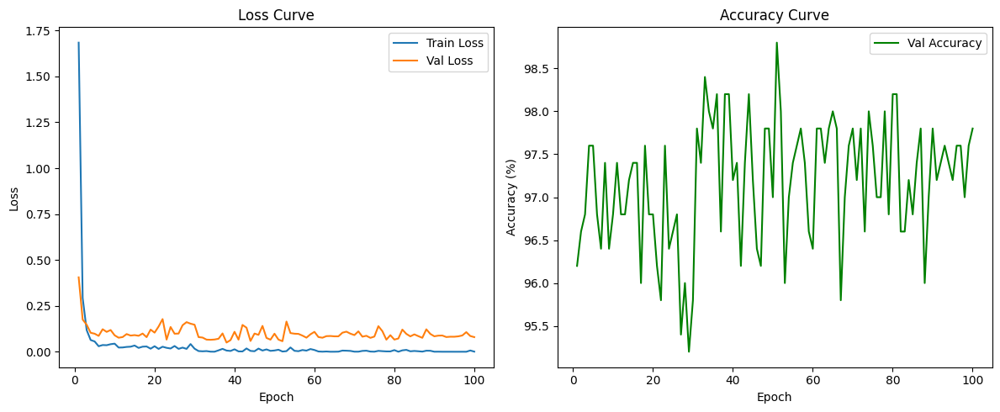

In [19]:
plot_training_curves(history)

In [20]:
print("\n🔍 To open TensorBoard, run below:")
print("%load_ext tensorboard")
print(f"%tensorboard --logdir={log_dir}")


🔍 To open TensorBoard, run below:
%load_ext tensorboard
%tensorboard --logdir=./runs/vit_finetune_20251111_170020


In [21]:
def predict_image(model, img_path, device, transform, class_names):
    img = Image.open(img_path).convert('RGB')
    tensor = transform(img).unsqueeze(0).to(device)
    model.eval()
    with torch.no_grad():
        outputs = model(tensor)
        _, pred = torch.max(outputs, 1)
    return class_names[pred.item()]

In [22]:
def visualize_predictions(model, img_dir, device, transform, class_names, num_samples=8):
    img_paths = glob.glob(os.path.join(img_dir, '*/*.jpg')) + glob.glob(os.path.join(img_dir, '*.jpg'))
    if not img_paths:
        print(f"⚠️ No images found in {img_dir}")
        return
    samples = random.sample(img_paths, min(num_samples, len(img_paths)))
    plt.figure(figsize=(16, 8))
    for i, img_path in enumerate(samples):
        pred_label = predict_image(model, img_path, device, transform, class_names)
        plt.subplot(2, 4, i+1)
        plt.imshow(Image.open(img_path))
        plt.title(f"Predicted: {pred_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

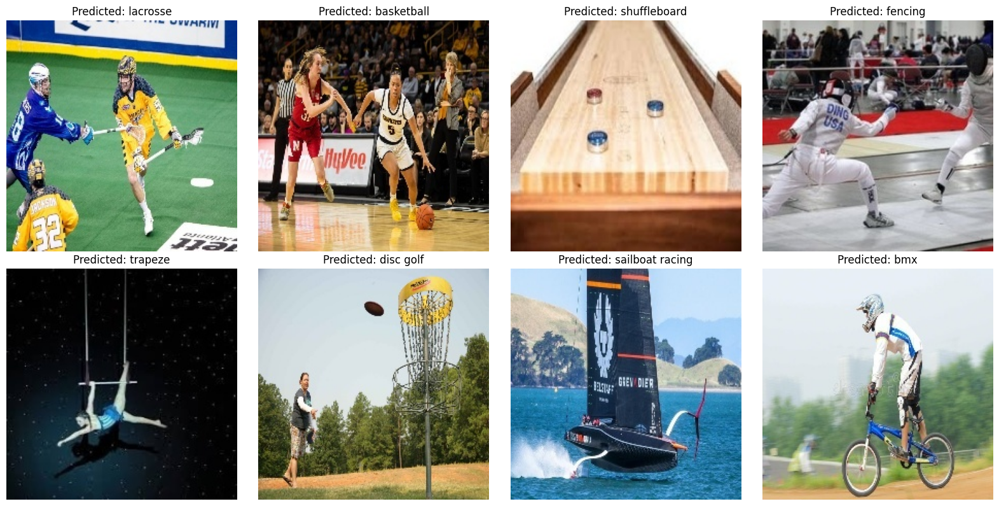

In [23]:
visualize_predictions(vit_model, os.path.join(data_root, "test"), device, transform_val, class_names)

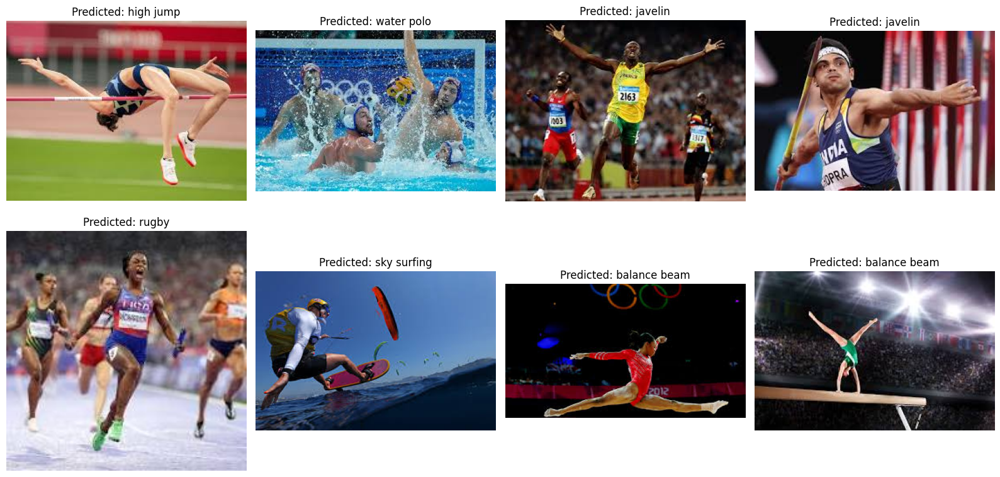

In [25]:
visualize_predictions(vit_model, "/content/Image2Predit", device, transform_val, class_names)

In [24]:
%load_ext tensorboard
%tensorboard --logdir=runs


Launching TensorBoard...

<IPython.core.display.Javascript object>